<a href="https://colab.research.google.com/github/jbsher/capstone/blob/main/preprocess_eda_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Brody Sherwood

## Capstone: Hagrid Hand Gesture Recognition

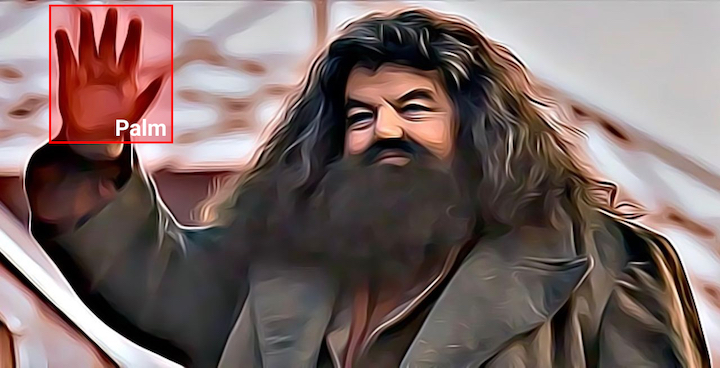

In [ ]:
!pip install torchmetrics
!pip install tensorboardX
!pip install tensorboard


Imports

In [4]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import os
import math
import cv2
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import json
import seaborn as sns
import pickle
import plotly.figure_factory as ff
import scipy.stats as stats
import plotly.graph_objects as go
import matplotlib.patches as patches
import tensorflow as tf
from glob import glob
from PIL import Image
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from tensorflow.keras.preprocessing import image as keras_image
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorboardX import SummaryWriter
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
from torch.cuda.amp import autocast, GradScaler


from sklearn.model_selection import train_test_split
from keras.preprocessing.image import ImageDataGenerator, img_to_array, array_to_img, load_img
from collections import defaultdict
import urllib

from torchvision import transforms as T
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import DataLoader
import torch
import torchvision
from torchvision.models.detection import FasterRCNN
from torch.utils.tensorboard import SummaryWriter
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.transforms import functional as F
from torchvision.transforms import ToTensor, Normalize
from torchvision.ops import MultiScaleRoIAlign
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.rpn import RPNHead, RegionProposalNetwork
from tqdm import tqdm
from torch.optim.lr_scheduler import StepLR
from sklearn.metrics import average_precision_score
from typing import Tuple
from PIL import ImageOps
from ipywidgets import interact
from IPython.display import Image as DImage


**Read in**

Note: This dataset is a subset of 1000 images per category that was taken from a much larger dataset.

In [3]:
class_names = ['call', 'dislike','fist','four','like','mute','ok','one',
               'palm','peace_inverted','peace','rock','stop_inverted',
               'stop','three','three2','two_up','two_up_inverted']

FORMATS = (".jpg")

transform = T.ToTensor()

# Paths to data
path_to_train = "/content/drive/MyDrive/capstone/data/train_val"
path_to_test = "/content/drive/MyDrive/capstone/data/test_"
path_to_annotations = '/content/drive/MyDrive/capstone/data/ann_train/'
path_to_subset_annotations = '/content/drive/MyDrive/capstone/data/ann_train_subset/'
path_to_test_annotations = '/content/drive/MyDrive/capstone/data/ann_test/'


**Preprocessor and import functions.**

In [5]:
# Preprocesser function
def preprocess_image_tf(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [320, 320])
    img = (tf.cast(img, tf.float32) / 255.0 - 0.5) * 2
    return img

In [6]:
def load_json_for_category(category, path_to_data):
    json_filepath = os.path.join(path_to_data, f"{category}.json")

    with open(json_filepath, 'r') as json_file:
        data = json.load(json_file)

    return data

def filter_json_by_images(json_data, available_images):
    return {uuid: meta for uuid, meta in json_data.items() if f"{uuid}.jpg" in available_images}


In [7]:
image_path_dict = {}
for category in class_names:
    category_folder = os.path.join(path_to_train, category)
    for filename in os.listdir(category_folder):
        if filename.endswith('.jpg'):
            uuid = filename.split('.')[0]
            image_path_dict[uuid] = os.path.join(category_folder, filename)

json_by_category = {category: load_json_for_category(category, path_to_annotations) for category in class_names}

combined_json_data = []
for category in class_names:
    for img_uuid, metadata in json_by_category[category].items():
        image_filepath = image_path_dict.get(img_uuid, None)
        if image_filepath:
            combined_json_data.append(((category, img_uuid), metadata))

filepaths = [image_path_dict[item[0][1]] for item in combined_json_data if item[0][1] in image_path_dict]
metadata_list = [{'bboxes': item[1]['bboxes'], 'labels': item[1]['labels']} for item in combined_json_data if item[0][1] in image_path_dict]


In [8]:
subset_annotations = {category: {} for category in class_names}
for (category, uuid), metadata in combined_json_data:
    subset_annotations[category][uuid] = metadata

if not os.path.exists(path_to_subset_annotations):
    os.makedirs(path_to_subset_annotations)

for category, annotations in subset_annotations.items():
    with open(os.path.join(path_to_subset_annotations, f"{category}.json"), "w") as file:
        json.dump(annotations, file)


In [9]:
#data = {}
#for category in class_names:
#    files_in_category = os.listdir(os.path.join(path_to_train, category))
#     category_uuids = [os.path.splitext(filename)[0] for filename in files_in_category if filename.endswith('.jpg')]
#     data[category] = category_uuids

# uuids_df = pd.DataFrame.from_dict(data, orient='index').transpose()


In [10]:
# master_data = []

# for (category, uuid), metadata in combined_json_data:
#     data_point = {
#         'category': category,
#         'uuid': uuid,
#         'image_path': image_path_dict[uuid],
#         'label': metadata['labels'][0],  # Assuming one label per image
#         'bbox': metadata['bboxes']
#     }
#     master_data.append(data_point)

# master_df = pd.DataFrame(master_data)


In [62]:
class_names = ['call', 'dislike','fist','four','like','mute','ok','one',
               'palm','peace_inverted','peace','rock','stop_inverted',
               'stop','three','three2','two_up','two_up_inverted', 'no_gesture']

transform = transforms.Compose([
    transforms.ToTensor(),
])


class Dataset(torch.utils.data.Dataset):

    @staticmethod
    def __get_files_from_dir(pth: str, extns: Tuple):
        if not os.path.exists(pth):
            print(f"Dataset directory doesn't exist {pth}")
            return []
        files = [f for f in os.listdir(pth) if f.endswith(extns)]
        return files

    def __read_annotations(self, path):
        annotations_all = None
        exists_images = []
        for target in class_names:
            path_to_csv = os.path.join(path, f"{target}.json")
            if os.path.exists(path_to_csv):
                json_annotation = json.load(open(
                    os.path.join(path, f"{target}.json")
                ))

                json_annotation = [dict(annotation, **{"name": f"{name}.jpg"}) for name, annotation in
                                   zip(json_annotation, json_annotation.values())]

                annotation = pd.DataFrame(json_annotation)

                annotation["target"] = target
                annotations_all = pd.concat([annotations_all, annotation], ignore_index=True)
                exists_images.extend(
                    self.__get_files_from_dir(os.path.join(self.path_images, target), FORMATS))
            else:
                if target != 'no_gesture':
                    print(f"Database for {target} not found")

        annotations_all["exists"] = annotations_all["name"].isin(exists_images)

        annotations_all = annotations_all[annotations_all["exists"]]

        users = annotations_all["user_id"].unique()
        users = sorted(users)
        random.Random(42).shuffle(users)
        train_users = users[:int(len(users) * 0.8)]
        val_users = users[int(len(users) * 0.8):]

        annotations_all = annotations_all.copy()

        if self.is_train:
            annotations_all = annotations_all[annotations_all["user_id"].isin(train_users)]
        else:
            annotations_all = annotations_all[annotations_all["user_id"].isin(val_users)]

        return annotations_all

    def __init__(self, path_annotation, path_images, is_train, transform=None):
        self.is_train = is_train
        self.transform = transform
        self.path_annotation = path_annotation
        self.path_images = path_images
        self.transform = transform
        self.labels = {label: num for (label, num) in
                       zip(class_names, range(len(class_names)))}
        self.annotations = self.__read_annotations(self.path_annotation)

    def __len__(self):
        return self.annotations.shape[0]

    def get_sample(self, index: int):
        row = self.annotations.iloc[[index]].to_dict('records')[0]
        image_pth = os.path.join(self.path_images, row["target"], row["name"])
        image = Image.open(image_pth).convert("RGB")

        labels = torch.LongTensor([self.labels[label] for label in row["labels"]])

        target = {}
        width, height = image.size

        bboxes = []

        for bbox in row["bboxes"]:
            x1, y1, w, h = bbox
            bbox_abs = [x1 * width, y1 * height, (x1 + w) * width, (y1 + h) * height]
            bboxes.append(bbox_abs)

        target["labels"] = labels
        target["boxes"] = torch.as_tensor(bboxes, dtype=torch.float32)
        target["orig_size"] = torch.as_tensor([int(height), int(width)])

        return image, target

    def __getitem__(self, index: int):
        image, target = self.get_sample(index)
        if self.transform:
            image = self.transform(image)
        return image, target

In [63]:
# Define transformation
random_seed = 42
num_classes = len(class_names)
batch_size = 8
num_epoch = 10

torch.manual_seed(random_seed)
np.random.seed(random_seed)
random.seed(random_seed)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')


train_data = Dataset(path_images=path_to_train,
                            path_annotation=path_to_subset_annotations,
                            is_train=True, transform=transform)

test_data = Dataset(path_images=path_to_test,
                            path_annotation=path_to_test_annotations,
                            is_train=False, transform=transform)



In [64]:
def collate_fn(batch):
    batch_targets = list()
    images = list()

    for b in batch:
        images.append(b[0])
        batch_targets.append({"boxes": b[1]["boxes"],
                              "labels": b[1]["labels"]})
    return images, batch_targets

In [65]:
train_dataloader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,collate_fn=collate_fn, shuffle=True, num_workers=4)
test_dataloader = torch.utils.data.DataLoader(test_data, batch_size=batch_size,collate_fn=collate_fn, shuffle=True, num_workers=4)

KAGGLE MODEL

In [66]:
lr = 0.005
momentum = 0.9
weight_decay = 5e-4

model = models.detection.ssdlite320_mobilenet_v3_large(num_classes=len(class_names) + 1, pretrained_backbone=True)
model.to(device)

optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
warmup_factor = 1.0 / 1000
warmup_iters = min(1000, len(train_data) - 1)

lr_scheduler_warmup = torch.optim.lr_scheduler.LinearLR(
    optimizer, start_factor=warmup_factor, total_iters=warmup_iters)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained_backbone' is deprecated since 0.13 and may be removed in the future, please use 'weights_backbone' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights_backbone' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights_backbone=MobileNet_V3_Large_Weights.IMAGENET1K_V1`. You can also use `weights_backbone=MobileNet_V3_Large_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [67]:
def eval(model, test_dataloader, epoch):
    model.eval()
    with torch.no_grad():
        mapmetric = MeanAveragePrecision()

        for images, targets in test_dataloader:
            images = list(image.to(device) for image in images)
            output = model(images)

            for pred in output:
                for key, value in pred.items():
                    pred[key] = value.cpu()

            mapmetric.update(output, targets)

    metrics = mapmetric.compute()
    return metrics

In [68]:
# Troubleshooting
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
if torch.cuda.is_available():
  generator = torch.Generator('cuda').manual_seed(random_seed)
else:
  generator = torch.Generator().manual_seed(random_seed)
print(torch.cuda.device_count())

1


In [69]:
!mkdir checkpoints

# Define the path to training checkpoint directory
checkpoint_dir = "/content/drive/MyDrive/capstone/training"

for epoch in range(num_epoch):
    model.train()
    total = 0
    sum_loss = 0
    for images, targets in tqdm(train_dataloader):
        batch = len(images)
        images = list(image.to(device) for image in images)
        for target in targets:
            for key, value in target.items():
                target[key] = value.to(device)
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss = losses.item()

        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        lr_scheduler_warmup.step()

        total = total + batch
        sum_loss = sum_loss + loss
    metrics = eval(model, test_dataloader, epoch)
    print(f"epoch : {epoch}  |||  loss : {sum_loss / total} ||| MAP : {metrics['map']}")

    # Save the model checkpoint
    checkpoint_path = os.path.join(checkpoint_dir, f"model_epoch_{epoch}.pth")
    torch.save(model.state_dict(), checkpoint_path)

    # Save training metrics to a log file
    log_file = os.path.join(checkpoint_dir, "training_log.txt")
    with open(log_file, "a") as f:
        f.write(f"Epoch: {epoch}  Loss: {sum_loss / total}  MAP: {metrics['map']}\n")

mkdir: cannot create directory ‘checkpoints’: File exists


100%|██████████| 1742/1742 [05:42<00:00,  5.08it/s]
/usr/local/lib/python3.10/dist-packages/torchmetrics/utilities/prints.py:43: UserWarning: Encountered more than 100 detections in a single image. This means that certain detections with the lowest scores will be ignored, that may have an undesirable impact on performance. Please consider adjusting the `max_detection_threshold` to suit your use case. To disable this warning, set attribute class `warn_on_many_detections=False`, after initializing the metric.
  warnings.warn(*args, **kwargs)  # noqa: B028


epoch : 0  |||  loss : 0.7470717236480937 ||| MAP : 0.31097570061683655


100%|██████████| 1742/1742 [05:40<00:00,  5.12it/s]


epoch : 1  |||  loss : 0.3564811050036225 ||| MAP : 0.4019901752471924


100%|██████████| 1742/1742 [05:41<00:00,  5.10it/s]


epoch : 2  |||  loss : 0.2878599203748673 ||| MAP : 0.41275039315223694


100%|██████████| 1742/1742 [05:44<00:00,  5.05it/s]


epoch : 3  |||  loss : 0.2512269008229801 ||| MAP : 0.44784340262413025


100%|██████████| 1742/1742 [05:47<00:00,  5.01it/s]


epoch : 4  |||  loss : 0.23574099839247065 ||| MAP : 0.4262147545814514


100%|██████████| 1742/1742 [05:43<00:00,  5.07it/s]


epoch : 5  |||  loss : 0.21664885145526763 ||| MAP : 0.5275382399559021


100%|██████████| 1742/1742 [05:41<00:00,  5.10it/s]


epoch : 6  |||  loss : 0.20595641835065126 ||| MAP : 0.5149077773094177


100%|██████████| 1742/1742 [05:43<00:00,  5.07it/s]


epoch : 7  |||  loss : 0.19701034139104864 ||| MAP : 0.47947952151298523


100%|██████████| 1742/1742 [05:41<00:00,  5.10it/s]


epoch : 8  |||  loss : 0.19778583587465223 ||| MAP : 0.5195438265800476


100%|██████████| 1742/1742 [05:44<00:00,  5.06it/s]


epoch : 9  |||  loss : 0.1941628965270817 ||| MAP : 0.5171839594841003


In [80]:
images = []
for gesture in class_names[:-1]:
    image_path = glob(f'/content/drive/MyDrive/capstone/data/test_/{gesture}/*.jpg')[0]
    images.append(Image.open(image_path))

images_tensors = images.copy()
images_tensors_input = list(transform(image).to(device) for image in images_tensors)

with torch.no_grad():
    model.eval()
    out = model(images_tensors_input)

In [81]:
bboxes = []
scores = []
labels = []
for pred in out:
    ids = pred['scores'] >= 0.2
    bboxes.append(pred['boxes'][ids][:2].cpu().numpy().astype(np.int))
    scores.append(pred['scores'][ids][:2].cpu().numpy())
    labels.append(pred['labels'][ids][:2].cpu().numpy())

<ipython-input-81-27f700cd89d1>:6: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  bboxes.append(pred['boxes'][ids][:2].cpu().numpy().astype(np.int))


In [83]:
short_class_names = []

for name in class_names:
    if name == 'stop_inverted':
        short_class_names.append('stop inv.')
    elif name == 'peace_inverted':
        short_class_names.append('peace inv.')
    elif name == 'two_up':
        short_class_names.append('two up')
    elif name == 'two_up_inverted':
        short_class_names.append('two up inv.')
    elif name == 'no_gesture':
        short_class_names.append('no gesture')
    else:
        short_class_names.append(name)

In [84]:
final_images = []
for bbox, score, label, image in zip(bboxes, scores, labels, images):
    image = np.array(image)
    for i, box in enumerate(bbox):
        _,width,_  = image.shape
        image = cv2.rectangle(image, box[:2], box[2:], thickness=3, color=[255, 0, 255])
        cv2.putText(image, f'{short_class_names[label[i]]}: {score[i]:0.2f}', (box[0], box[1]), cv2.FONT_HERSHEY_SIMPLEX,
                        width / 780, (0, 0, 255), 2)
    final_images.append(Image.fromarray(image))

In [88]:
!mkdir out_images
out_images = []
for i, image in enumerate(final_images):
    out_name = f"out_images/{i}.png"
    out_images.append(out_name)
    image.save(out_name)
    import ipywidgets as widgets
from IPython.display import display

# Define a function to display images
def show_images(file):
    image_path = os.path.join(out_dir, file)
    display(DImage(image_path, width=320, height=320))

# Create a list of file names in the output directory
file_list = os.listdir(out_dir)

# Use interact to create the widget for selecting images
@widgets.interact(file=widgets.Dropdown(options=file_list))
def select_and_display_image(file):
    show_images(file)


mkdir: cannot create directory ‘out_images’: File exists


interactive(children=(Dropdown(description='file', options=('9.png', '15.png', '11.png', '6.png', '4.png', '14…

PYTORCH MODEL

In [ ]:
!pip install tensorboard
from torch.utils.tensorboard import SummaryWriter


In [ ]:
log_dir = "/path/to/log/directory"  # Replace with your preferred directory
writer = SummaryWriter(log_dir)


In [ ]:
def get_object_detection_model(num_classes):
    # Load a pre-trained ResNet-50 model as the backbone
    backbone = fasterrcnn_resnet50_fpn(pretrained=True)

    # Modify the final fully connected layer to match the number of classes
    in_features = backbone.roi_heads.box_predictor.cls_score.in_features
    backbone.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

    # Define RPN custom head for anchor generation
    rpn_head = RPNHead(in_channels=backbone.out_channels,
                       num_anchors=3)

    # Create anchor generator
    rpn_anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                           aspect_ratios=((0.5, 1.0, 2.0),) * 5)

    # Define ROI Align module
    roi_pooler = MultiScaleRoIAlign(
        featmap_names=['0'], output_size=7, sampling_ratio=2)

    # Create the Faster R-CNN model
    model = FasterRCNN(
        backbone,
        num_classes=num_classes,
        rpn_head=rpn_head,
        rpn_anchor_generator=rpn_anchor_generator,
        box_roi_pool=roi_pooler
    )

    return model


In [ ]:
# Define model and optimizer
model = get_object_detection_model(num_classes)
optimizer = torch.optim.SGD(model.parameters(), lr=lr, momentum=momentum, weight_decay=weight_decay)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=lr_step_size, gamma=lr_gamma)

for epoch in range(num_epochs):
    model.train()
    total_loss = 0.0

    for batch_idx, (images, targets) in enumerate(train_dataloader):

        # Move images and targets to the GPU if available
        images = [img.to(device) for img in images]
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        # Forward pass
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())

        # Backpropagation and optimization
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()

        # Log training loss
        writer.add_scalar("Loss/train", losses.item(), epoch * len(train_dataloader) + batch_idx)

        # Adjust the learning rate
        lr_scheduler.step()

        # Validation and model evaluation (if needed)
        if (batch_idx + 1) % eval_freq == 0:
            metrics = evaluate_model(model, test_dataloader)
            print(f"Epoch {epoch + 1}/{num_epochs}, Batch {batch_idx + 1}/{len(train_dataloader)}: Loss: {losses.item()}, Metrics: {metrics}")

# Save the trained model
torch.save(model.state_dict(), 'gesture_detection_model.pth')
writer.close()  # Close the writer when done


In [ ]:
uuids_df.to_csv('/content/drive/MyDrive/capstone/data/uuids_df.csv', index=False)
master_df.to_csv('/content/drive/MyDrive/capstone/data/master_df.csv', index=False)


In [ ]:
# Save combined_json_data
with open('/content/drive/MyDrive/capstone/data/combined_json_data.json', 'w') as f:
    json.dump(combined_json_data, f)

In [ ]:
# Image paths
with open('/content/drive/MyDrive/capstone/data/image_path_dict.json', 'w') as f:
    json.dump(image_path_dict, f)

*Test*

---
LOAD DATA

---

*Train*

In [ ]:
uuids_df = pd.read_csv('/content/drive/MyDrive/capstone/data/uuids_df.csv')
master_df = pd.read_csv('/content/drive/MyDrive/capstone/data/master_df.csv')

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/capstone/data/train.csv')

In [ ]:
with open('/content/drive/MyDrive/capstone/data/avg_rgb_by_category.pkl', 'rb') as file:
    avg_rgb_by_category = pickle.load(file)

*Test*

---
Statistical Features

NOTE: The colors chosen for plotting were tested on simulators of all kinds of colorblindess to ensure readability.

https://www.color-blindness.com/coblis-color-blindness-simulator/

In [ ]:
# Load image from file path
def load_image_from_filepath(filepath):
    image = cv2.imread(filepath)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def get_average_rgb(image):
    return np.mean(image, axis=(0, 1))

avg_rgb_by_category = {}

# Initialize category data
for category in class_names:
    avg_rgb_by_category[category] = []

for (category, img_uuid), meta in combined_json_data:
    # Use image_path_dict to get the correct path
    image_path = image_path_dict.get(img_uuid)
    if image_path:  # Ensure the path exists
        image = load_image_from_filepath(image_path)
        avg_rgb = get_average_rgb(image)
        avg_rgb_by_category[category].append(avg_rgb)

for category in avg_rgb_by_category:
    avg_rgb_by_category[category] = np.mean(avg_rgb_by_category[category], axis=0)


In [ ]:
# Saving 'avg_rgb_by_category' to a pickle file
with open('/content/drive/MyDrive/capstone/data/avg_rgb_by_category.pkl', 'wb') as file:
    pickle.dump(avg_rgb_by_category, file)


In [ ]:
def plot_rgb_for_subset(categories_subset, subset_number):
    avg_rgb_subset = [avg_rgb_by_category[cat] for cat in categories_subset]

    # Create table data
    table_data = [['Category', 'Avg Red', 'Avg Green', 'Avg Blue']]
    for cat, rgb in zip(categories_subset, avg_rgb_subset):
        table_data.append([cat, round(rgb[0], 2), round(rgb[1], 2), round(rgb[2], 2)])

    # Create the table figure
    fig = ff.create_table(table_data, height_constant=60)

    # Bar chart data
    avg_red = [round(rgb[0], 2) for rgb in avg_rgb_subset]
    avg_green = [round(rgb[1], 2) for rgb in avg_rgb_subset]
    avg_blue = [round(rgb[2], 2) for rgb in avg_rgb_subset]

    # Create bar chart traces
    trace1 = go.Bar(x=categories_subset, y=avg_red, xaxis='x2', yaxis='y2', marker=dict(color='#AB3640'), name='Avg Red')
    trace2 = go.Bar(x=categories_subset, y=avg_green, xaxis='x2', yaxis='y2', marker=dict(color='#C7D01D'), name='Avg Green')
    trace3 = go.Bar(x=categories_subset, y=avg_blue, xaxis='x2', yaxis='y2', marker=dict(color='#7E7ED8'), name='Avg Blue')

    # Add bar chart traces to the figure
    fig.add_traces([trace1, trace2, trace3])

    # Initialize xaxis2 and yaxis2
    fig['layout']['xaxis2'] = {}
    fig['layout']['yaxis2'] = {}

    # Edit layout for subplots
    fig.layout.yaxis.update({'domain': [0, .45]})
    fig.layout.yaxis2.update({'domain': [.6, 1]})
    fig.layout.yaxis2.update({'anchor': 'x2'})
    fig.layout.xaxis2.update({'anchor': 'y2'})
    fig.layout.yaxis2.update({'title': 'RGB Values'})

    # Update the margins to add a title and see graph x-labels
    fig.layout.margin.update({'t': 75, 'l': 50})
    fig.layout.update({'title': f'Average RGB values for Categories ({subset_number})'})

    # Adjust the height
    fig.layout.update({'height': 800})

    # Display the plot
    fig.show()

# Now, you can use the provided function to plot
all_categories = list(avg_rgb_by_category.keys())
for i in range(0, len(all_categories), 6):
    subset = all_categories[i:i+6]
    plot_rgb_for_subset(subset, f"{i+1}-{i+len(subset)}")


In [ ]:
# Retrieve the top categories based on average color values
def top_categories_for_color(color_index, n=3):
    sorted_categories = sorted(avg_rgb_by_category.items(),
                               key=lambda x: x[1][color_index],
                               reverse=True)
    return [cat[0] for cat in sorted_categories[:n]]

top_red = top_categories_for_color(0)
top_green = top_categories_for_color(1)
top_blue = top_categories_for_color(2)

unique_top_categories = list(set(top_red + top_green + top_blue))

plot_rgb_for_subset(unique_top_categories, "Top Categories by RGB")

***'two_up'*** has the highest average **Red**, with ***'call'*** having both the highest average **Green** and **Blue.**





Lets take a look at some sample images as well as their rgb color characteristics.

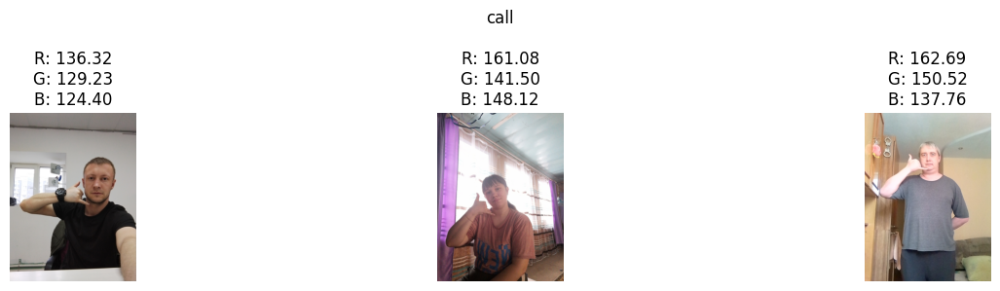

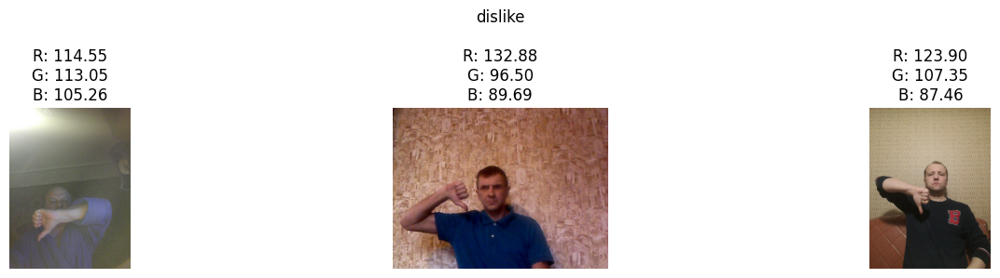

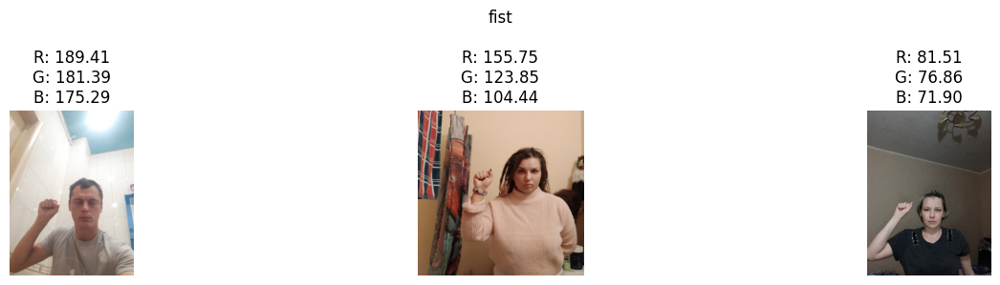

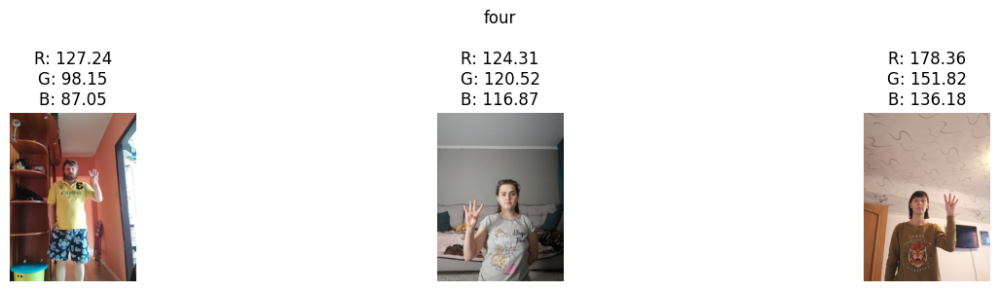

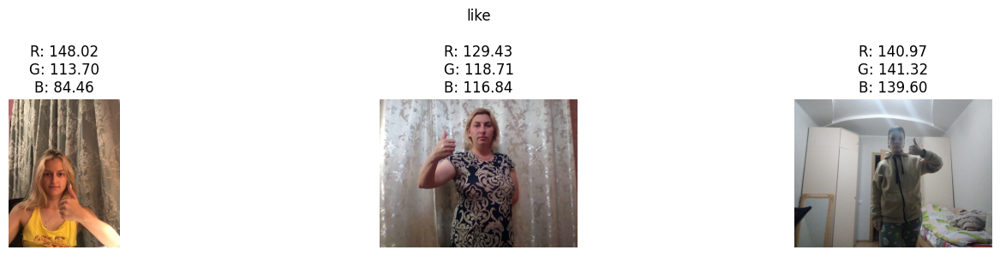

...

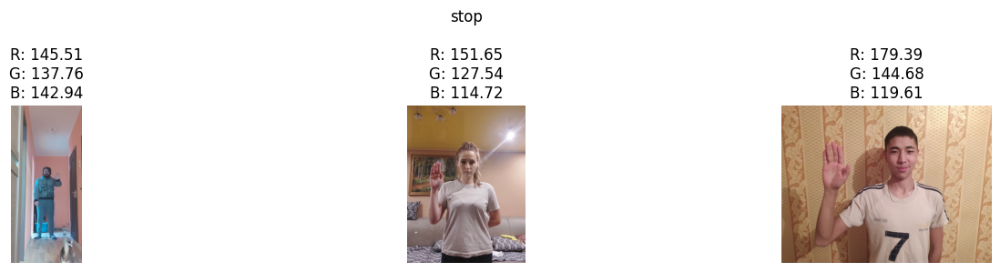

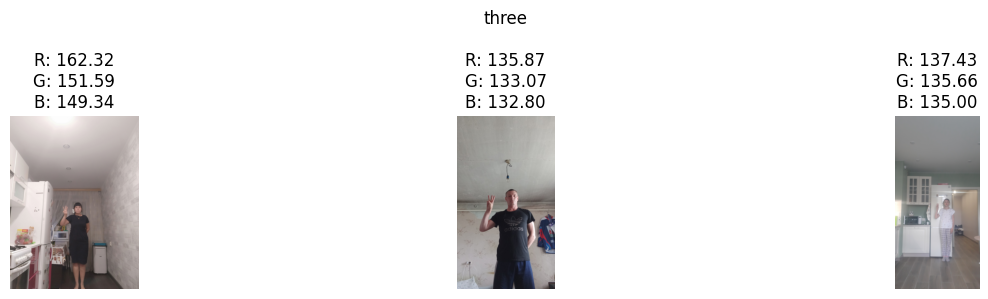

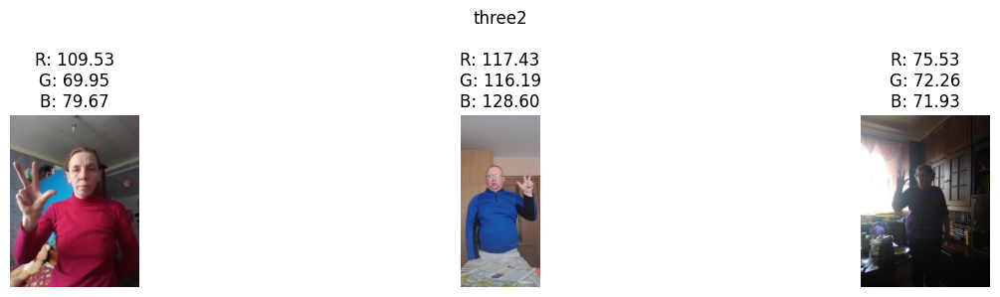

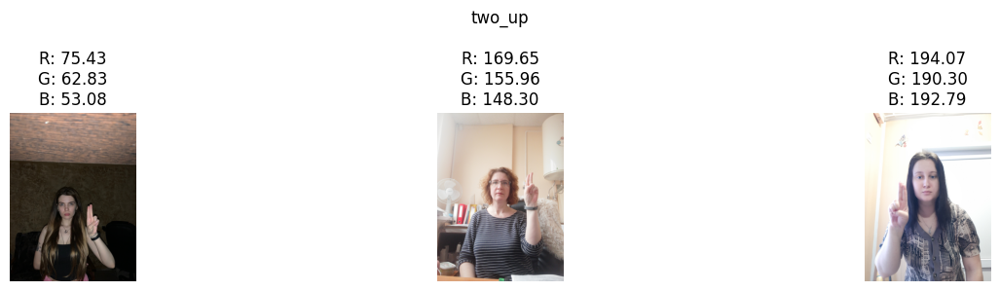

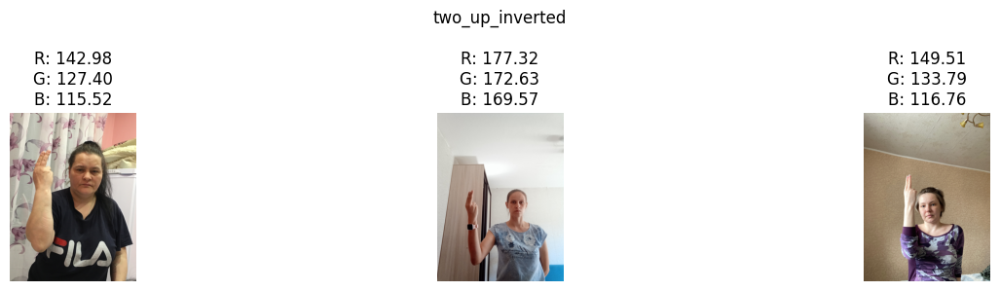

In [ ]:
# Display sample images with their average RGB values
def display_sample_images_with_rgb(data, num_samples=3):
    # Group data by category
    data_by_category = {}
    for (category, img_uuid), _ in data:
        if category not in data_by_category:
            data_by_category[category] = []
        data_by_category[category].append(img_uuid)

    for category, uuids in data_by_category.items():
        sample_uuids = np.random.choice(uuids, num_samples, replace=False)
        sample_filepaths = [os.path.join(path_to_train, category, f"{uuid}.jpg") for uuid in sample_uuids]

        fig, axes = plt.subplots(1, num_samples, figsize=(15, 3))
        fig.suptitle(category)

        for ax, filepath in zip(axes, sample_filepaths):
            img = load_image_from_filepath(filepath)
            avg_rgb = get_average_rgb(img)

            ax.imshow(img)
            ax.set_title(f"R: {avg_rgb[0]:.2f}\nG: {avg_rgb[1]:.2f}\nB: {avg_rgb[2]:.2f}")
            ax.axis('off')

        plt.tight_layout()
        plt.show()

display_sample_images_with_rgb(combined_json_data)

Many of these images were either very dark, pixelated, or the person in the picture is far away, making it difficult to make out the hand sign. For this reason, I *increased* the image resolution from **128** **x** **128** to **320** **x** **320** for more detail during modeling. The model that we want to use wants images in this size. Seen above are the latter images.

Visualizing landmarks and bounding boxes

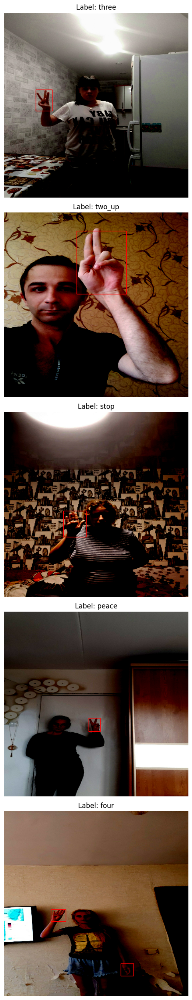

In [ ]:
def visualize_data_with_bboxes(dataset, num_samples=5):
    """
    Visualize the data with associated UUIDs and bounding boxes.

    Args:
    - dataset: The dataset object.
    - num_samples: Number of random samples to visualize.
    """
    fig, axs = plt.subplots(num_samples, figsize=(5, 25))

    # Extract a batch from the dataset
    for batch in dataset.take(1):  # Only taking one batch for visualization
        images, labels, bboxes_batch = batch

        # Randomly select data samples from the batch
        sample_indices = np.random.choice(len(images), num_samples, replace=False)

        for i, idx in enumerate(sample_indices):
            img = images[idx].numpy()
            bboxes = bboxes_batch[idx].numpy()

            # If the image tensor is a numpy array, we can directly plot it
            axs[i].imshow(img)
            title_text = f"Label: {labels[idx].numpy().decode('utf-8')}"
            axs[i].set_title(title_text)

            # Draw bounding boxes
            for bbox in bboxes:
                if np.any(bbox):  # Check if the bounding box is not [0,0,0,0] (padded value)
                    x, y, width, height = bbox[0] * img.shape[1], bbox[1] * img.shape[0], bbox[2] * img.shape[1], bbox[3] * img.shape[0]
                    rect = patches.Rectangle((x, y), width, height, linewidth=1, edgecolor='r', facecolor='none')
                    axs[i].add_patch(rect)

            axs[i].axis("off")

    plt.tight_layout()
    plt.show()

# Visualize the data
visualize_data_with_bboxes(dataset)


Bounding Box Distribution

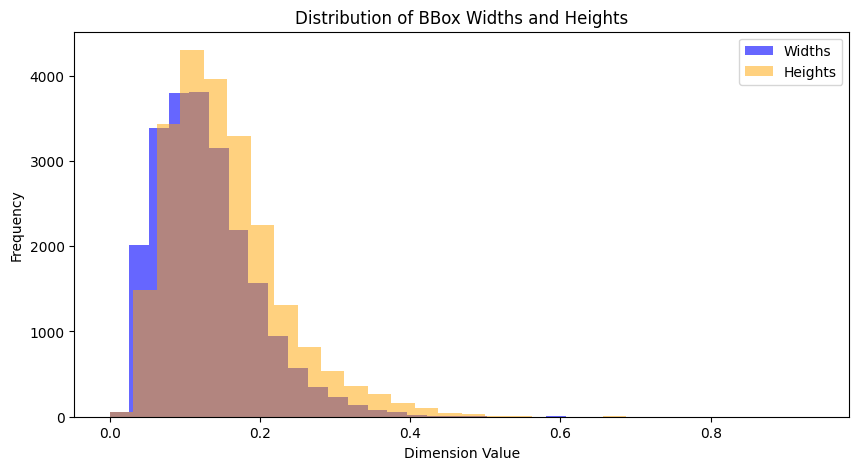

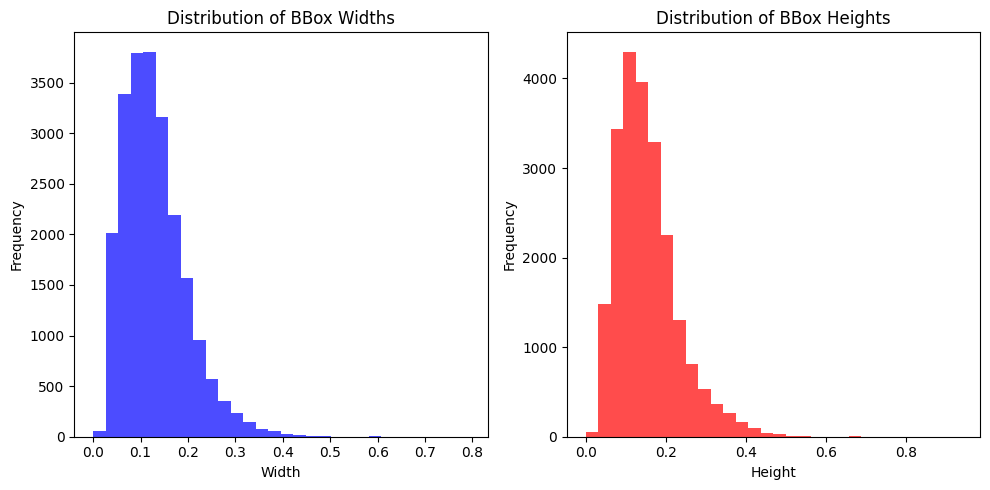

In [ ]:
plt.figure(figsize=(10, 5))

plt.hist(bbox_widths, bins=30, color='blue', alpha=0.6, label='Widths')
plt.hist(bbox_heights, bins=30, color='orange', alpha=0.5, label='Heights')

plt.title('Distribution of BBox Widths and Heights')
plt.xlabel('Dimension Value')
plt.ylabel('Frequency')
plt.legend()

plt.show()

bbox_widths = []
bbox_heights = []

for entry in combined_json_data:
    bboxes = entry[1]['bboxes']
    for bbox in bboxes:
        x, y, w, h = bbox
        bbox_widths.append(w)
        bbox_heights.append(h)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.hist(bbox_widths, bins=30, color='blue', alpha=0.7)
plt.title('Distribution of BBox Widths')
plt.xlabel('Width')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(bbox_heights, bins=30, color='red', alpha=0.7)
plt.title('Distribution of BBox Heights')
plt.xlabel('Height')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()


Bounding Box Heatmap

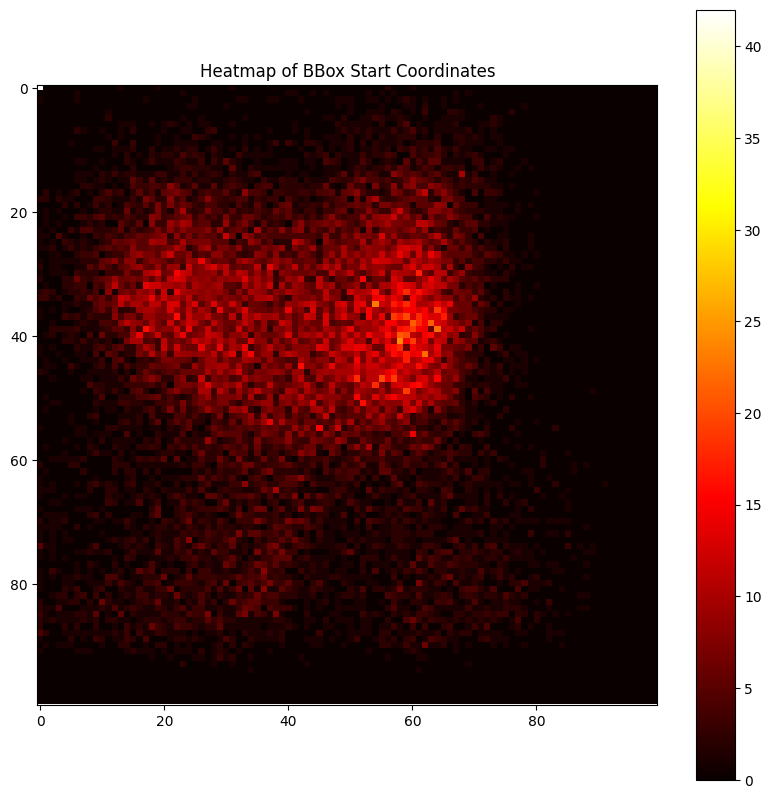

In [ ]:
heatmap = np.zeros((100, 100))  # Assuming normalized coordinates

for entry in combined_json_data:
    bboxes = entry[1]['bboxes']
    for bbox in bboxes:
        x, y, _, _ = [int(coord * 99) for coord in bbox]  # Multiplying by 99 to fit our heatmap size
        heatmap[y, x] += 1

plt.figure(figsize=(10, 10))
plt.imshow(heatmap, cmap='hot')
plt.colorbar()
plt.title('Heatmap of BBox Start Coordinates')
plt.show()


Leading Hand in Picture

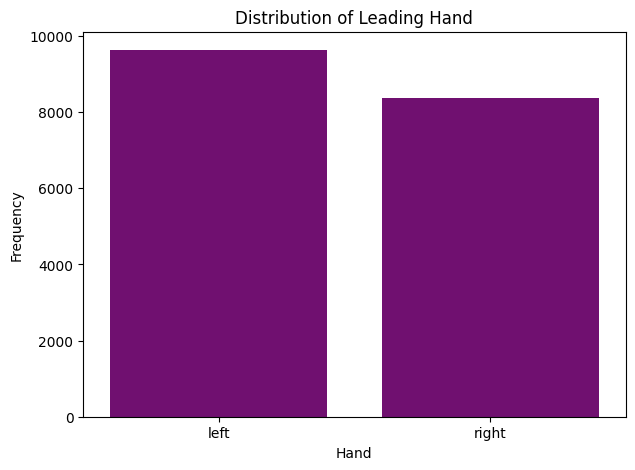

In [ ]:
# Extract leading hands
leading_hands = [entry[1]['leading_hand'] for entry in combined_json_data]

# Create the countplot
plt.figure(figsize=(7, 5))
sns.countplot(x=leading_hands, color="purple")
plt.title('Distribution of Leading Hand')
plt.xlabel('Hand')
plt.ylabel('Frequency')
plt.show()

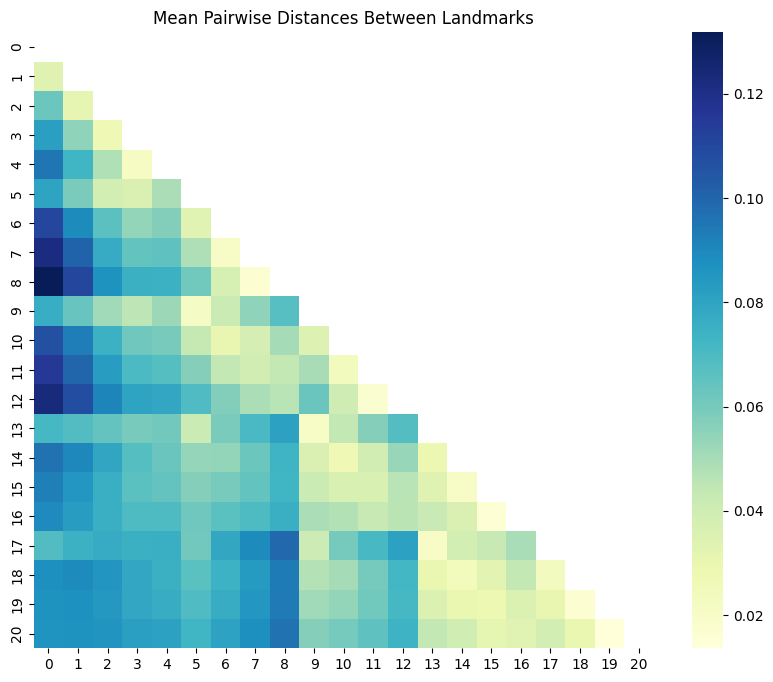

In [ ]:
def compute_pairwise_distances(landmarks):
    num_landmarks = len(landmarks)
    distances = np.zeros((num_landmarks, num_landmarks))

    for i in range(num_landmarks):
        for j in range(num_landmarks):
            # Convert landmarks to numpy arrays
            lm1 = np.array(landmarks[i])
            lm2 = np.array(landmarks[j])

            # Euclidean distance
            if lm1.shape == lm2.shape:  # Check if both landmarks have the same shape
                dist = np.linalg.norm(lm1 - lm2)
                distances[i, j] = dist

    return distances

# Compute mean distances
total_distances = np.mean([compute_pairwise_distances(lm) for lm in all_landmarks], axis=0)

# Create a mask for the upper triangle
mask = np.triu(np.ones_like(total_distances, dtype=bool))

# Visualization
plt.figure(figsize=(10, 8))
sns.heatmap(total_distances, cmap="YlGnBu", mask=mask)
plt.title('Mean Pairwise Distances Between Landmarks')
plt.show()


Lighter blocks are where landmarks are close to each other, with the center being the distance to itself. Respectively, darker spots indicate larger distances between landmarks. This makes sense, since we see some darker spots towards the edges and lighter clusters towards the middle. This confirms that our data is looking as expected.

In [ ]:
# Extract bounding box sizes
bbox_areas = [w*h for entry in combined_json_data for _, _, w, h in entry[1]['bboxes']]

mean_area = np.mean(bbox_areas)
std_area = np.std(bbox_areas)
threshold_upper = mean_area + 3 * std_area
threshold_lower = mean_area - 3 * std_area

# Images with outlier bounding boxes
outliers_large = [entry for entry in combined_json_data if any(w*h > threshold_upper for _, _, w, h in entry[1]['bboxes'])]
outliers_small = [entry for entry in combined_json_data if any(w*h < threshold_lower for _, _, w, h in entry[1]['bboxes'])]

print(f"Mean bounding box area: {mean_area:.2f}")
print(f"Standard deviation of bounding box area: {std_area:.2f}")
print(f"Upper threshold: {threshold_upper:.2f}")
print(f"Lower threshold: {threshold_lower:.2f}")
print(f"Number of images with bounding boxes larger than the threshold: {len(outliers_large)}")
print(f"Number of images with bounding boxes smaller than the threshold: {len(outliers_small)}")

Mean bounding box area: 0.02
Standard deviation of bounding box area: 0.02
Upper threshold: 0.09
Lower threshold: -0.05
Number of images with bounding boxes larger than the threshold: 391
Number of images with bounding boxes smaller than the threshold: 0


In [ ]:
num_multi_bbox_images = len(multi_bbox_images)
num_no_bbox_images = len(no_bbox_images)

print(f"Number of images with multiple bounding boxes: {num_multi_bbox_images}")
print(f"Number of images with no bounding boxes: {num_no_bbox_images}")


Number of images with multiple bounding boxes: 4374
Number of images with no bounding boxes: 0
